# Predict the total number of Washington D.C. bicycle users


William Kingwill

Data - https://www.kaggle.com/christianlillelund/csgo-round-winner-classification


**--------------------------------------------------------------------------------------------------------------------------------------------------------------------------**

## Agenda

**I. Python environment setup**

**II. Data source setup**
  
**III. Explorative Data Analysis (EDA)**

  1. Data Overview
  2. Data Cleaning - Missing Values Analysis & Handling
  3. Feature Engineering
  4. Outlier Analysis
  5. Visualizations
  
**IV. Machine Learning**
  1. Train-Test Splitting
  2. Correlations
  3. PCA Analysis
  
**V. Prediction Algorithms**
  1. Regression
  2. Elastic Net
  3. Lasso Regression
  4. Random Forest
  5. XGBoost

**VI. Predicting casual & registered**


 
 
 **--------------------------------------------------------------------------------------------------------------------------------------------------------------------------**

## Introduction

In this analysis we are going to model the number of Washingtion D.C. Bicycle sharing users, on an hourly basis.
Several Machine Learning algorithms will be tested, using numerous variables (e.g. temperature, wind, humidity etc.) and what effect these have on the total number of rented bikes.


  * Training data: whole 2011 and first 3 quarters of 2012.
    * Test data: 4th quarter of 2012.  Do not use it to fit your models!
    * Target: total number of users (cnt)
    * Error metric: R2 score (scikit-learn's default for regression).
    * Features to use: at least the ones present in the data (except for cnt, casual, and registered).

## Data Understanding

* instant: record index
* dteday : date
* hr : hour (0 to 23)
* weathersit : Weather situation
* temp : Normalized temperature in Celsius. The values are divided to 41 (max)
* atemp: Normalized feeling temperature in Celsius. The values are divided to 50 (max)
* hum: Normalized humidity. The values are divided to 100 (max)
* windspeed: Normalized wind speed. The values are divided to 67 (max)
* casual: count of casual users
* registered: count of registered users
* cnt: count of total rental bikes including both casual and registered


**--------------------------------------------------------------------------------------------------------------------------------------------------------------------------**

# 1. Environment setup

In [124]:
#load important libraries
import numpy as np
import pandas as pd
import pandas_profiling
import datetime
import math as m

# plotting libraries
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

# ML libraries
import os
from sklearn import svm
from sklearn import metrics
from sklearn import preprocessing
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import GridSearchCV, cross_val_score, cross_val_predict, train_test_split

# styling
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>")) # Increase cell width
display(HTML("<style>.rendered_html { font-size: 16px; }</style>")) # Increase font size
plt.style.use("fivethirtyeight")
sns.set_style('whitegrid')
sns.set_context('talk')

# 2. Data source setup

In [125]:
# read the dataset
hour_df = pd.read_csv('hour.csv', index_col='instant')
hour_df.head()

,dteday,hr,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
instant,,,,,,,,,,
1,2011-01-01,0,"Clear, Few clouds, Partly cloudy, Partly cloudy",0.24,0.2879,0.81,0.0,3,13,16
2,2011-01-01,1,"Clear, Few clouds, Partly cloudy, Partly cloudy",0.22,0.2727,0.80,0.0,8,32,40
3,2011-01-01,2,"Clear, Few clouds, Partly cloudy, Partly cloudy",0.22,0.2727,0.80,0.0,5,27,32
4,2011-01-01,3,"Clear, Few clouds, Partly cloudy, Partly cloudy",0.24,0.2879,0.75,0.0,3,10,13
5,2011-01-01,4,"Clear, Few clouds, Partly cloudy, Partly cloudy",0.24,0.2879,0.75,0.0,0,1,1


# 3. Explorative Data Analysis (EDA) 

* Exploratory Data Analysis (descriptive analytics) (3/3 points)
* Ensuring data quality (correctness, consistency, missing values, outliers...) 
* Plotting clear and meaningful figures 
* Giving insights on what seems relevant for prediction and what does not 
* Bonus points for:
    * Studying the influence of combinations of features (not just individual features) 
    * Checking possibly redundant variables via correlations 
    
    
* Data Engineering (3/3 points)
* Discussion on missing values and outliers 
* Treatment of text and date features 
* Generation of extra features (e.g., season, yes/no holiday, hours of daylight, combinations of features, 
    quantization/binarization, polynomial features)Use of scikit-learn pipelines to perform transformations


## 3.1. Data Overview

In [165]:
#import warnings
import warnings 
warnings.filterwarnings('ignore')

report = pandas_profiling.ProfileReport(hour_df)
report

<span style='background :yellow' > Takeaways </span> : ***As the pandas profiling report states, we have a total of 11 variables and 17379 Observations within the dataset. There are no duplicate rows, but a total of 499 missing values were found. These need to be investigated and handled. As it appears the count of registered and casual bike rides sum up to the total count.***

In [127]:
print("Shape of data set:",hour_df.shape)

Shape of data set: (17379, 10)


***For easier reference the columns will be renamed:***

In [128]:
#renaming columns for easier reference

hour_df.rename(columns={'instant':'ride_id','dteday':'datetime','weathersit':'weather_condition',
                        'hum':'humidity','cnt':'total_count','hr':'hour', 'atemp':'apparent_temp',},inplace=True)

In [129]:
#check the info of the dataset (like dtype of the columns etc.)
hour_df.dtypes

datetime              object
hour                   int64
weather_condition     object
temp                 float64
apparent_temp        float64
humidity             float64
windspeed            float64
casual                 int64
registered             int64
total_count            int64
dtype: object

<span style='background :yellow' > Takeaways </span> : ***All columns are numerical except weather_condition, which is an object with catagorical information***

In [130]:
#get an understanding of statistics for the target variable "total_count"
print("The total number of bikes rented ranges between " + str(min(hour_df["total_count"])) + " and " + str(max(hour_df["total_count"])))
print(hour_df['total_count'].describe())

The total number of bikes rented ranges between 1 and 977
count    17379.000000
mean       189.463088
std        181.387599
min          1.000000
25%         40.000000
50%        142.000000
75%        281.000000
max        977.000000
Name: total_count, dtype: float64


## 3.2. Data Cleaning - Missing Values Analysis & Handling

***In this section we are going to investigate the missing values, identified in the pandas profiling report.***

In [131]:
#Check how many null values the dataset has 
hour_df.isnull().sum()

datetime               0
hour                   0
weather_condition    100
temp                  99
apparent_temp        100
humidity             100
windspeed            100
casual                 0
registered             0
total_count            0
dtype: int64

<span style='background :yellow' > Takeaways </span> : ***Evidently, weather_condition, temp, humidity and windspeed have a high number of missing values. These need to be handled accordingly.***

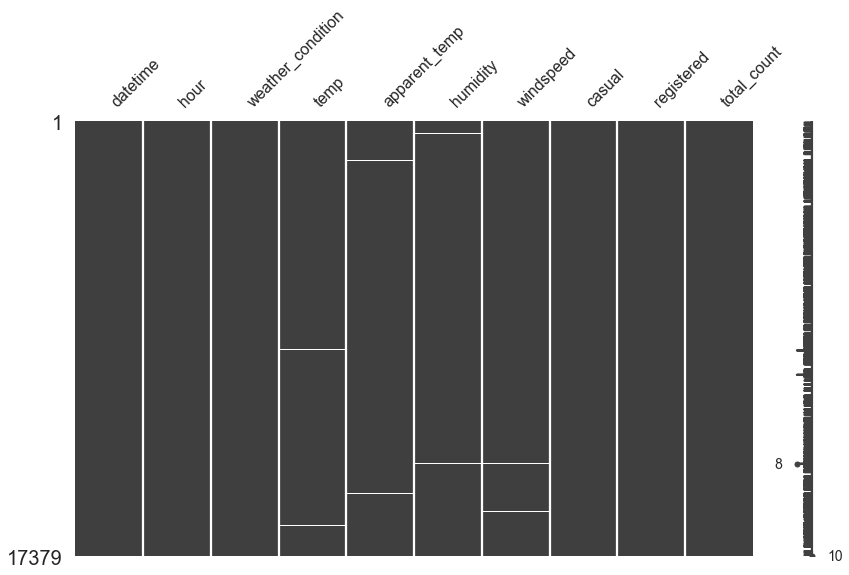

In [132]:
#use missingno library to visualize missing values
import missingno as msno
%matplotlib inline

msno.matrix(hour_df, figsize=(12,8));
# msno.dendrogram(hour_df);

<span style='background :yellow' > Takeaways </span> : ***As it can be clearly seen, the missing values are spread throughout each column and are not positioned directly after each other. This is an important insight, as we can apply different fillna methods, such as 'ffill', which uses its previous value to fill the NaNs.***

### 3.2.1. Feature analysis on missing values columns 

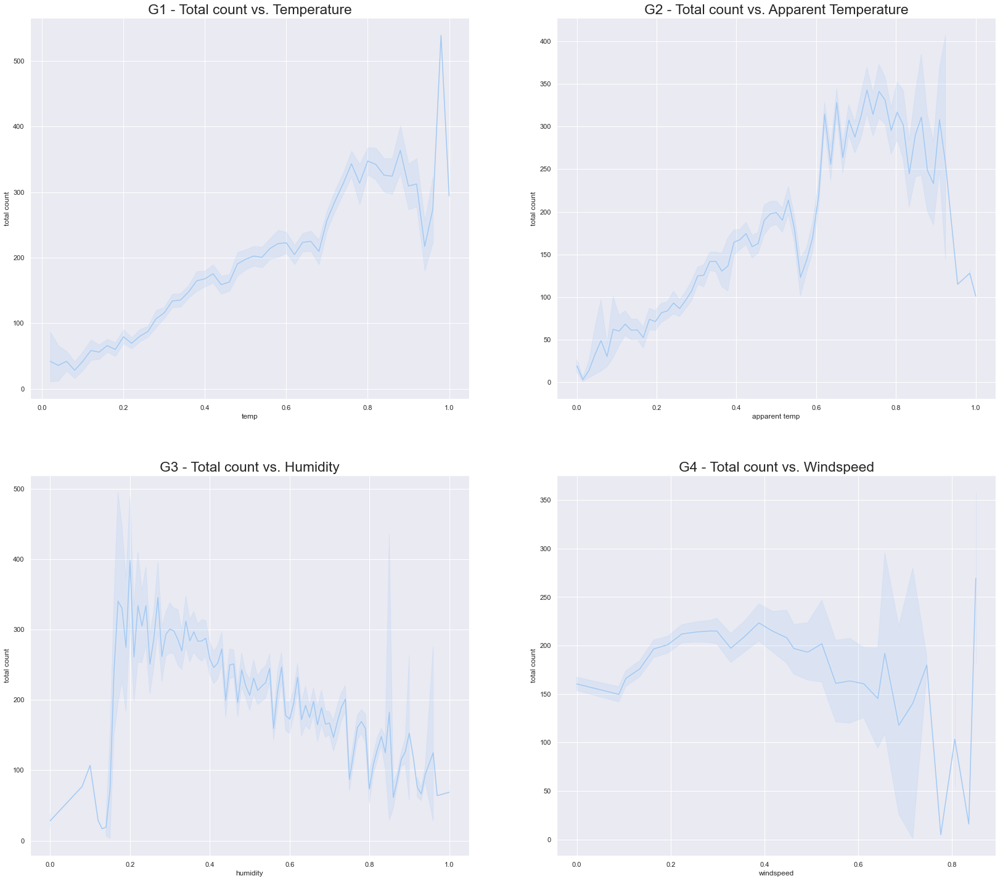

In [133]:
# setting graph frame
sns.set(palette='pastel');
fig, axes = plt.subplots(nrows=2,ncols=2);
fig.set_size_inches(25, 25);
sns.set(font_scale = 1.9)

# creating several histograms

# Temperature vs total_count
sns.lineplot(x="temp", 
             y="total_count", 
             data=hour_df,
             err_style='band',
             ax=axes[0][0]);
# Apparent Temperature vs total_count
sns.lineplot(x="apparent_temp", 
             y="total_count", 
             data=hour_df, 
             err_style='band',
             ax=axes[0][1]);
# Humidity vs total_count
sns.lineplot(x="humidity", 
             y="total_count", 
             data=hour_df, 
             err_style='band',
             ax=axes[1][0]);
# Windspeed vs total_count
sns.lineplot(x="windspeed", 
             y="total_count", 
             data=hour_df, 
             err_style='band',
             ax=axes[1][1]);

# labelling graphs
axes[0][0].set(xlabel='temp', 
               ylabel='total count', 
               title="G1 - Total count vs. Temperature");

axes[0][1].set(xlabel='apparent temp', 
               ylabel='total count',
               title="G2 - Total count vs. Apparent Temperature");

axes[1][0].set(xlabel='humidity', 
               ylabel='total count',
               title="G3 - Total count vs. Humidity");

axes[1][1].set(xlabel='windspeed', 
               ylabel='total count',
               title="G4 - Total count vs. Windspeed");

<span style='background :yellow' > Takeaways </span> : ***G1, G2, G3 and G4 are Lineplots with error margins:***

* ***G1 - Clear trend between the total count (number of bike users) and an increasing temperature. At 0.9 it hits its peak temperature and declines afterwards. The final spike indicates potential outliers.***

* ***G2 - Evident trend between a rising apparent temperature (realfeel temp) and an increasing total number of bike users. Towards the highest recordings, the error margin increases substantially.***

* ***G3 - With rising humidity the total number of bike users declines almost proportionately. In the beginning there is an extreme spike.***

* ***G4 - The effect of the Windspeed seems to be stable until it reachs a peak at around 0.7, then the total number of bike users declines rapidly. There is an extreme spike at the highest recording.***


***The error margins and extreme spikes need further investigation, in terms of outliers.***

# 3. Feature Engineering

***Feature engineering is the process of transforming raw data into features that better represent the underlying problem to the predictive models, resulting in improved model accuracy on unseen data.***

## 3.1. Pipeline Setup

In [134]:
#import necessary libraries
from sklearn.compose import ColumnTransformer, make_column_transformer
from sklearn.impute  import SimpleImputer
from sklearn.compose import make_column_selector
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.preprocessing import FunctionTransformer
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder

***Define function to use in pipeline:***

In [135]:
#define ffill function to be applied in the following steps
def ffill(X_col): 
    return (
      X_col.fillna(method = 'ffill')
      #.to_frame()
   )

In [136]:
#define function to round datetime to the nearest hour

def rounder(t):
    if t.minute >= 30:
        return t.replace(second=0, microsecond=0, minute=0, hour=t.hour+1)
    else:
        return t.replace(second=0, microsecond=0, minute=0)

In [137]:
#define a function to create columns from the given datetime column

from pandas.tseries.holiday import USFederalHolidayCalendar as calendar
import astral                      # used for determining sunrise, sunset 
from astral import Location, Astral

def DateColumnCreations(data) : 
    
    #date-time conversion
    data['datetime'] = pd.to_datetime(data.datetime)
    
    #create year column
    data['year'] = pd.DatetimeIndex(data['datetime']).year
    
    #create month column
    data['month'] = pd.DatetimeIndex(data['datetime']).month
    
    #create day column
    data['day'] = pd.DatetimeIndex(data['datetime']).day
    
    #create season column
    data['season'] = (data['datetime'].dt.month%12 + 3)//3
    
    #create holiday column
    cal = calendar()
    holidays = cal.holidays(start=data['datetime'].min(), end=data['datetime'].max())

    data['holiday'] = data['datetime'].isin(holidays).astype(int)
    
    #create weekday column
    data['weekday'] = pd.DatetimeIndex(data['datetime']).weekday
    
    #setting up
    a = Astral()
    location = a['Washington DC']     # set location washington DC
    
   
    for i,row in data.iterrows():
     
     #create working_day column - Monday until Friday
        if data.loc[i,'weekday'] > 4:
            data.at[i,'workingday'] = 0
        else:
            data.at[i,'workingday'] = 1
        
    #create weekend column - Saturday + Sunday
        if data.loc[i,'weekday'] > 4:
            data.at[i,'weekend'] = 1
        else:
            data.at[i,'weekend'] = 0
    
    #create Daylight column 
        sun = location.sun(local = True , date = data.loc[i,'datetime']) 
    
        if (data.loc[i,'hour'] >= rounder(sun['sunrise']).hour) and (data.loc[i,'hour'] <= rounder(sun['sunset']).hour):
            data.loc[i,'daylight'] = 1
        else: 
            data.loc[i,'daylight'] = 0

    #create peak hours weekend and weekday     
        if (data.loc[i, 'weekend'] == 1) & ( data.loc[i, 'hour'] in [12,13,14,15]):
            data.loc[i, "peak_weekend"] = 1 
        else: 
            data.loc[i, "peak_weekend"] = 0
    
        if (data.loc[i, 'workingday'] == 1) & ( data.loc[i, 'hour'] in [7,8,17,18]):
            data.loc[i, "peak_workingday"] = 1 
        else: 
            data.loc[i, "peak_workingday"] = 0
    
    return data

***Convert functions into transformer:***

In [138]:
#fill function 
ffill_Imp = FunctionTransformer(ffill)
DateColumnCreations_Imp = FunctionTransformer(DateColumnCreations)

***Handle column weather_condition:***


***The ffill method for null values runs into problems with operating on columns that are not numerical. When used within the column transformer pipeline it does not fill the null values correctly. As we beieve it is the best method to deal with nulls in the weather_condition column, and it seems to work correctly when applied individualy to the weather_condition column. It was decided to handle the nulls in the weather_conditoion column seperatly here before the pipeline.***

In [139]:
#convert weather_condition to type category 
hour_df.weather_condition = hour_df.weather_condition.astype('category')

In [140]:
#handling missing values with ffill method
hour_df['weather_condition'] = hour_df['weather_condition'].fillna(method='ffill')

In [141]:
#check if missing values from weather_condition were imputed
hour_df.isnull().sum()

datetime               0
hour                   0
weather_condition      0
temp                  99
apparent_temp        100
humidity             100
windspeed            100
casual                 0
registered             0
total_count            0
dtype: int64

***Create column transformer:***

In [142]:
#create a column transformer to use in pipeline 

ct = ColumnTransformer([
   
   ("ffill_nulls" , ffill_Imp, ['windspeed', 'temp', 'humidity', 'apparent_temp',],),   #use ffill on all numeric columns 
   ('Onehot', OneHotEncoder(drop= None), ['weather_condition',],),                      #create Boolean dummy columns for weather_condition
    ('DateColumns',DateColumnCreations_Imp, ['datetime','hour'],)                       #create all new feature columns relating to date 
    
] ,remainder='passthrough')

In [143]:
#function to cast transformed array to data frame, rename columns and assign variable types 

def NameColumns(data_df):
    #cast ct output to dataframe and name columns 
    data_df = pd.DataFrame(data_df)
    data_df.columns = ['windspeed', 'temp', 'humidity', 'apparent_temp',
                       'clear','heavy','light','mist', 'datetime','hour', 'year', 
                       'month', 'day', 'season', 'holiday','weekday','workingday','weekend', 'daylight',
                        'peak_weekend', 'peak_workingday', 'casual', 'registered', 'total_count',
                      ]
    
    #assign variable types
    data_df[['windspeed', 'temp', 'humidity', 'apparent_temp',
                    'clear','heavy','light','mist','hour', 'year', 
                    'month', 'day', 'season', 'holiday','weekday',
                    'workingday','weekend','daylight','peak_weekend',
                    'peak_workingday', 'casual', 'registered', 'total_count',
             
           ]] =   data_df[['windspeed', 'temp', 'humidity', 'apparent_temp',
                            'clear','heavy','light','mist', 'hour', 'year',  
                            'month', 'day', 'season', 'holiday','weekday',
                            'workingday','weekend', 'daylight','peak_weekend',
                            'peak_workingday', 'casual', 'registered', 'total_count',
                         ]].astype("float")
    return data_df

In [144]:
#transform columns with ct 
hour_df = ct.fit_transform(hour_df)

In [145]:
#rename columns 
hour_df = NameColumns(hour_df)
hour_df.iloc[0,:]

windspeed                            0
temp                              0.24
humidity                          0.81
apparent_temp                   0.2879
clear                                1
heavy                                0
light                                0
mist                                 0
datetime           2011-01-01 00:00:00
hour                                 0
year                              2011
month                                1
day                                  1
season                               1
holiday                              0
weekday                              5
workingday                           0
weekend                              1
daylight                             0
peak_weekend                         0
peak_workingday                      0
casual                               3
registered                          13
total_count                         16
Name: 0, dtype: object

In [146]:
#check column datatypes
hour_df.dtypes

windspeed                 float64
temp                      float64
humidity                  float64
apparent_temp             float64
clear                     float64
heavy                     float64
light                     float64
mist                      float64
datetime           datetime64[ns]
hour                      float64
year                      float64
month                     float64
day                       float64
season                    float64
holiday                   float64
weekday                   float64
workingday                float64
weekend                   float64
daylight                  float64
peak_weekend              float64
peak_workingday           float64
casual                    float64
registered                float64
total_count               float64
dtype: object

In [147]:
#check if all null values have been imputed
hour_df.isnull().sum()

windspeed          0
temp               0
humidity           0
apparent_temp      0
clear              0
heavy              0
light              0
mist               0
datetime           0
hour               0
year               0
month              0
day                0
season             0
holiday            0
weekday            0
workingday         0
weekend            0
daylight           0
peak_weekend       0
peak_workingday    0
casual             0
registered         0
total_count        0
dtype: int64

In [148]:
print("Shape of data set:",hour_df.shape)

Shape of data set: (17379, 24)


<span style='background :yellow' > **Takeaways** </span> : ***After advanced feature factorization & engineering the original 10 features were increased to 24. This includes dummy encoding and OneHotEncoder. Furthermore, the missing values were calculated using the ffill method since the dataset is on an hourly basis. Hence, the value before should be very similar to the missing one. It is assumed that the temperature, apparent temperature, windspeed and humidity do not change much within an hour. In the case of the daylight feature an advanced library was imported, based on which the exact sunrise and sunset hours could be identified and through which the total number of daylight hours could be calculated.*** 

## 3.4. Outlier Analysis

***Another aspect that may affect the performance of our machine learning pipeline is the presence of outliers. We will focus on the numerical columns of the dataset to detect the presence of outliers and proceed to their removal. The easiest way to detect outliers is visualizing the numerical values; for instance, by `boxploting` the column values.***


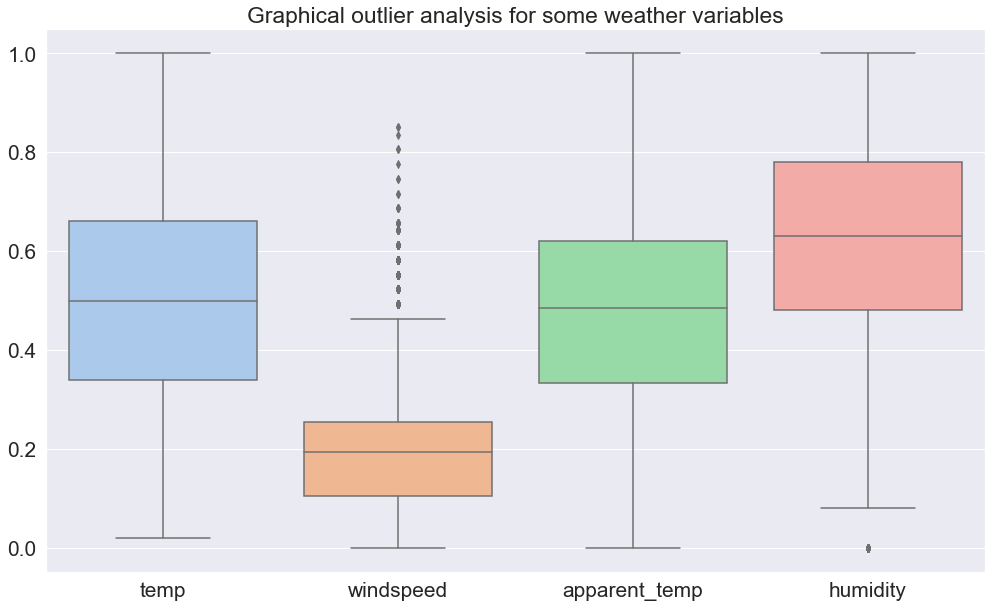

In [149]:
#create a boxplot to look for outliers in some weather columns
plt.figure(figsize=(15, 10))
sns.boxplot(data=hour_df[['temp', 'windspeed', 'apparent_temp', 'humidity',]], 
            palette='pastel');
plt.title("Graphical outlier analysis for some weather variables");
sns.set(font_scale=1.5)

<span style='background :yellow' > **Takeaways** </span> : ***From the box plots it is clear to see that we may have outliers in the windspeed and humidity columns. We will explore this more to investigate whether these really are outliers and how they should be handled.***

### 3.4.1. Humidity outliers

***To investigate outliers Sklearn LocalOutlierFactor package was used. The anomaly score of each sample is called Local Outlier Factor. It measures the local deviation of density of a given sample with respect to its neighbors. It is local in that the anomaly score depends on how isolated the object is with respect to the surrounding neighborhood. More precisely, locality is given by k-nearest neighbors, whose distance is used to estimate the local density. By comparing the local density of a sample to the local densities of its neighbors, one can identify samples that have a substantially lower density than their neighbors. These are considered outliers.***


In [150]:
# humidity outlier detection
from sklearn.ensemble import IsolationForest
from sklearn.neighbors import LocalOutlierFactor

X = hour_df[['humidity']]
cov =  LocalOutlierFactor().fit_predict(X)
out = cov
print('number of outliers:', (out==-1).sum())
hour_df[(out==-1)].head(10)

# reassigning outliers with nan
# i = (out==-1)
# hour_df.at[i,'humidity'] = m.nan

# # fill nan with previous values
# hour_df['humidity'] = hour_df['humidity'].fillna(method='ffill')

number of outliers: 41


,windspeed,temp,humidity,apparent_temp,clear,heavy,light,mist,datetime,hour,...,holiday,weekday,workingday,weekend,daylight,peak_weekend,peak_workingday,casual,registered,total_count
414,0.1045,0.24,0.92,0.2576,0.0,0.0,0.0,1.0,2011-01-19,7.0,...,0.0,2.0,1.0,0.0,1.0,0.0,1.0,1.0,89.0,90.0
1108,0.2537,0.54,0.10,0.5152,1.0,0.0,0.0,0.0,2011-02-18,22.0,...,0.0,4.0,1.0,0.0,0.0,0.0,0.0,19.0,88.0,107.0
1109,0.2836,0.52,0.08,0.5000,1.0,0.0,0.0,0.0,2011-02-18,23.0,...,0.0,4.0,1.0,0.0,0.0,0.0,0.0,16.0,61.0,77.0
1110,0.4925,0.48,0.12,0.4697,1.0,0.0,0.0,0.0,2011-02-19,0.0,...,0.0,5.0,0.0,1.0,0.0,0.0,0.0,6.0,23.0,29.0
1111,0.4179,0.46,0.14,0.4545,1.0,0.0,0.0,0.0,2011-02-19,1.0,...,0.0,5.0,0.0,1.0,0.0,0.0,0.0,10.0,21.0,31.0
1112,0.3881,0.44,0.13,0.4394,1.0,0.0,0.0,0.0,2011-02-19,2.0,...,0.0,5.0,0.0,1.0,0.0,0.0,0.0,3.0,14.0,17.0
1113,0.2985,0.42,0.14,0.4242,1.0,0.0,0.0,0.0,2011-02-19,3.0,...,0.0,5.0,0.0,1.0,0.0,0.0,0.0,0.0,7.0,7.0
1319,0.1045,0.34,0.96,0.3485,0.0,0.0,0.0,1.0,2011-02-28,6.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,27.0,28.0
1517,0.0000,0.38,0.20,0.3939,0.0,0.0,0.0,1.0,2011-03-08,14.0,...,0.0,1.0,1.0,0.0,1.0,0.0,0.0,16.0,56.0,72.0
1533,0.1045,0.24,0.85,0.2576,0.0,0.0,0.0,1.0,2011-03-09,6.0,...,0.0,2.0,1.0,0.0,0.0,0.0,0.0,5.0,44.0,49.0


<span style='background :yellow' > **Takeaways** </span> : ***There were 41 outliers detected in the humidity column. They seem to be very high and low values for humidity as expected. To investigate if these could really be considered outliers, considering our data is time series hourly data, the values before and after the identified outliers were looked at. To see if the represented unrealistic values. This process is shown for outlier indexed at 414 below. It can be seen that this instance can not really be seen as a outlier, as all the humidity values for that day are very high. It was just a extremly humid day that day. This is not information we want to remove from our training set beacuse, as seen previously, humidity has an effect on the number of people renting bikes. If we remove or handle this values we could lose significant information that relating to the effect humidity has on the total_count. Therefore it is decided not to treat these values in the humidity column as outliers.*** 

In [151]:
hour_df.iloc[410:420,1:4]

,temp,humidity,apparent_temp
410,0.22,0.93,0.2273
411,0.22,0.93,0.2273
412,0.22,0.93,0.2576
413,0.22,0.93,0.2576
414,0.24,0.92,0.2576
415,0.24,0.93,0.2576
416,0.24,0.93,0.2576
417,0.26,0.93,0.2727
418,0.28,0.87,0.3030
419,0.30,0.81,0.3182


### 3.4.2. Windspeed outliers

In [152]:
# windspeed outlier detection
from sklearn.covariance import EllipticEnvelope 
from sklearn.ensemble import IsolationForest
from sklearn.neighbors import LocalOutlierFactor

X = hour_df[['windspeed']]
cov =  LocalOutlierFactor().fit_predict(X)
out = cov
print('number of outliers:', (out==-1).sum())
hour_df[(out==-1)].head(10)

# # reassigning outliers with nan
# i = (out==-1)
# hour_df.at[i,'windspeed'] = m.nan

# # fill nan with previous values
# hour_df['windspeed'] = hour_df['windspeed'].fillna(method='ffill')

number of outliers: 15


,windspeed,temp,humidity,apparent_temp,clear,heavy,light,mist,datetime,hour,...,holiday,weekday,workingday,weekend,daylight,peak_weekend,peak_workingday,casual,registered,total_count
1017,0.7761,0.30,0.42,0.2424,1.0,0.0,0.0,0.0,2011-02-15,1.0,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,5.0,5.0
1018,0.6866,0.28,0.41,0.2273,1.0,0.0,0.0,0.0,2011-02-15,2.0,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,2.0,3.0
1125,0.7463,0.44,0.16,0.4394,1.0,0.0,0.0,0.0,2011-02-19,15.0,...,0.0,5.0,0.0,1.0,1.0,1.0,0.0,84.0,87.0,171.0
1259,0.8060,0.46,0.41,0.4545,1.0,0.0,0.0,0.0,2011-02-25,15.0,...,0.0,4.0,1.0,0.0,1.0,0.0,0.0,5.0,50.0,55.0
1261,0.7463,0.32,0.49,0.2727,1.0,0.0,0.0,0.0,2011-02-25,17.0,...,0.0,4.0,1.0,0.0,1.0,0.0,1.0,8.0,181.0,189.0
4315,0.8507,0.80,0.49,0.7424,0.0,0.0,1.0,0.0,2011-07-03,17.0,...,0.0,6.0,0.0,1.0,1.0,0.0,0.0,181.0,177.0,358.0
4316,0.8507,0.80,0.49,0.7424,0.0,0.0,1.0,0.0,2011-07-03,18.0,...,0.0,6.0,0.0,1.0,1.0,0.0,0.0,74.0,107.0,181.0
5635,0.8358,0.64,0.89,0.5758,0.0,0.0,1.0,0.0,2011-08-27,17.0,...,0.0,5.0,0.0,1.0,1.0,0.0,0.0,2.0,14.0,16.0
9652,0.6866,0.10,0.46,0.0455,0.0,0.0,0.0,1.0,2012-02-12,3.0,...,0.0,6.0,0.0,1.0,0.0,0.0,0.0,0.0,14.0,14.0
9653,0.7164,0.10,0.46,0.0455,0.0,0.0,0.0,1.0,2012-02-12,4.0,...,0.0,6.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0


<span style='background :yellow' > **Takeaways** </span> : ***Similar to Humidity, when the Outliers of Windspeed were checked they were found to be normal for the weather conditions on that day. Therefore, no Outlier Handling was done for the Windspeed feature either.***

## 3.5 Visualization

***This section provides a graphical overview of the features and their relationships to provide some meaningful insights.***

### 3.5.1 Total number of bikes rent per season

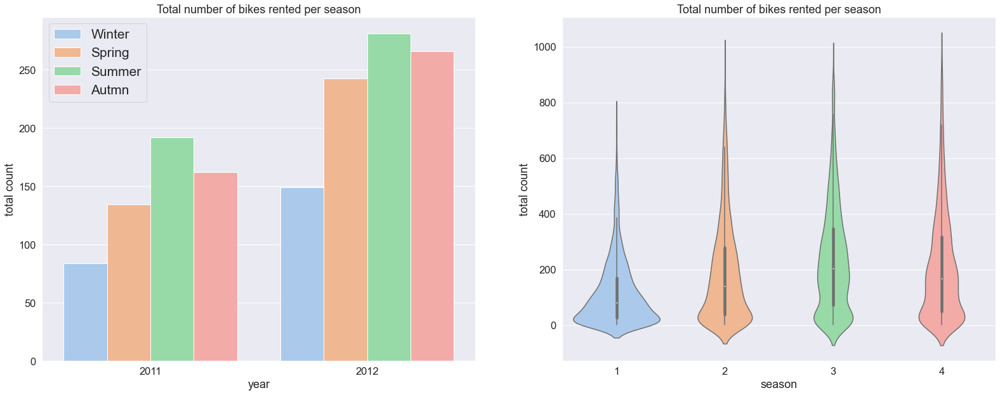

In [153]:
# setting graph frame
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(24,10))

# creating barplot to get the bikes rent per season
ax1 = sns.barplot(hour_df['year'].astype(int), hour_df['total_count'], hue='season', data=hour_df, palette='pastel', ci=None, ax=ax1,);
ax2 = sns.violinplot(hour_df['season'].astype(int), 'total_count', data=hour_df, palette='pastel', ax=ax2,);

# labelling graph
ax1.set(xlabel='year', ylabel='total count', title='Total number of bikes rented per season', label='big',);
ax2.set(xlabel='season', ylabel='total count', title='Total number of bikes rented per season', label='big',);
sns.set(font_scale = 1.9)

# renaming seasons
ax1.legend(labels=["Winter", "Spring", "Summer", "Autmn"]);

<span style='background :yellow' > **Takeaways** </span> : ***The bike rental follows the pattern of having less users during the winter months compared to spring, summer and autmn. Interestingly, more bikes are being rented in the autmn than spring. Additionally, for each season, the distribution can be seen in the violin plot. Overall, there is substantially more data available for the year 2012 in comparison to 2011.***

### 3.5.2. Total number of bikes per month

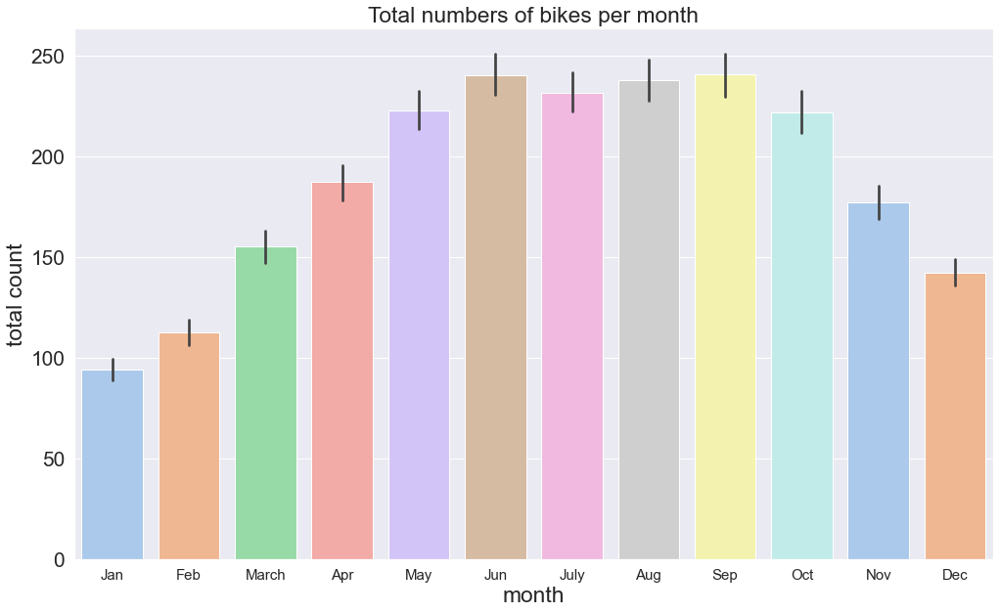

In [154]:
#number of bikes rent per hour
plt.figure(figsize=(15, 10),)
ax = sns.barplot(data=hour_df, 
                 x=hour_df["month"], 
                 y="total_count", 
                 palette='pastel',);
ax.set(xlabel='month', ylabel='total count', title="Total numbers of bikes per month", label='big',);
plt.xticks([0,1,2,3,4,5,6,7,8,9,10,11], 
           ["Jan", "Feb", "March", "Apr", "May", "Jun", "July", "Aug","Sep","Oct","Nov","Dec",], 
           fontsize = 15,);

<span style='background :yellow' > **Takeaways** </span> : ***As the graph shows the total number of bike users is lowest in January, however increases with every month, until hitting a peak in June. This peak is kept stable until September, indicating that the warm weather of the summer could be the reason for the higher number of bike users. Towards the final months of the year the number of bike users declines gradually again.***

### 3.5.3 Average bike users per hour

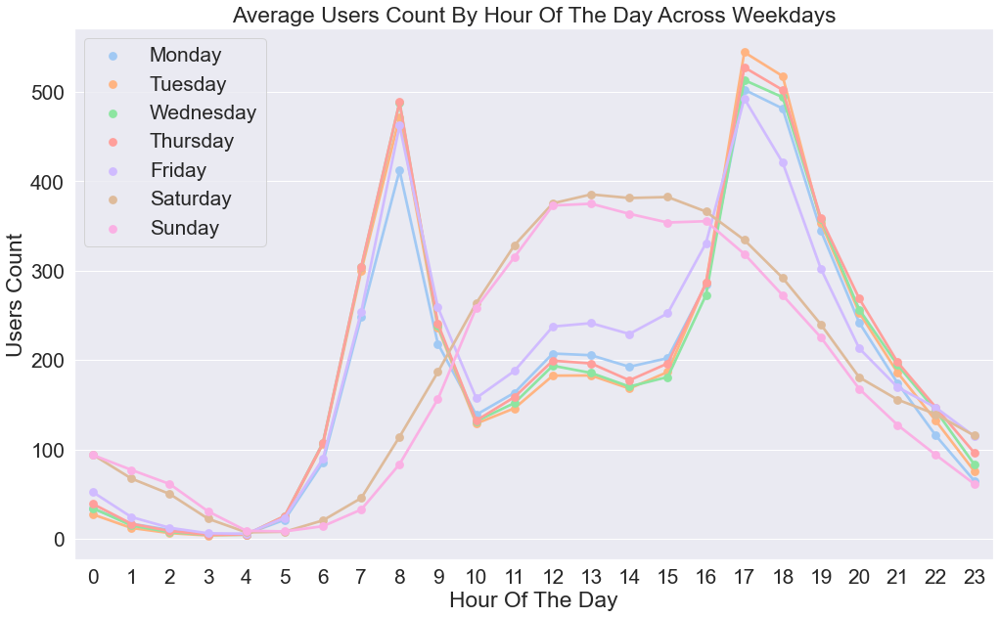

In [155]:
# graph setup
plt.figure(figsize=(15, 10),)
sns.set_palette('pastel')

hours = pd.DataFrame(hour_df.groupby(["hour","weekday"], sort=True)["total_count"].mean()).reset_index();
ax = sns.pointplot(x=hours["hour"].astype(int), y=hours["total_count"], hue=hours["weekday"], data=hours);
ax.set(xlabel='Hour Of The Day', ylabel='Users Count', title="Average Users Count By Hour Of The Day Across Weekdays", label='big',);

# renaming workingdays
leg_handles = ax.get_legend_handles_labels()[0]
ax.legend(leg_handles, ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]);

<span style='background :yellow' > **Takeaways** </span> : ***The graph should be interpreted in two different ways. Firstly, looking at data during the working days, the number of bike users peaks twice. In the morning, between 5-8am and in the evening between 4-7pm. This can be explained by the people getting and returning to work. The remaining two lines, represent the weekend activity. As the graph clearly shows, the number of bike users increases during towards midday (11am-3pm). This clearly shows, that the number of bike users differs during workingdays and on the weekend.***

### 3.5.4 Registered vs. casual bike users

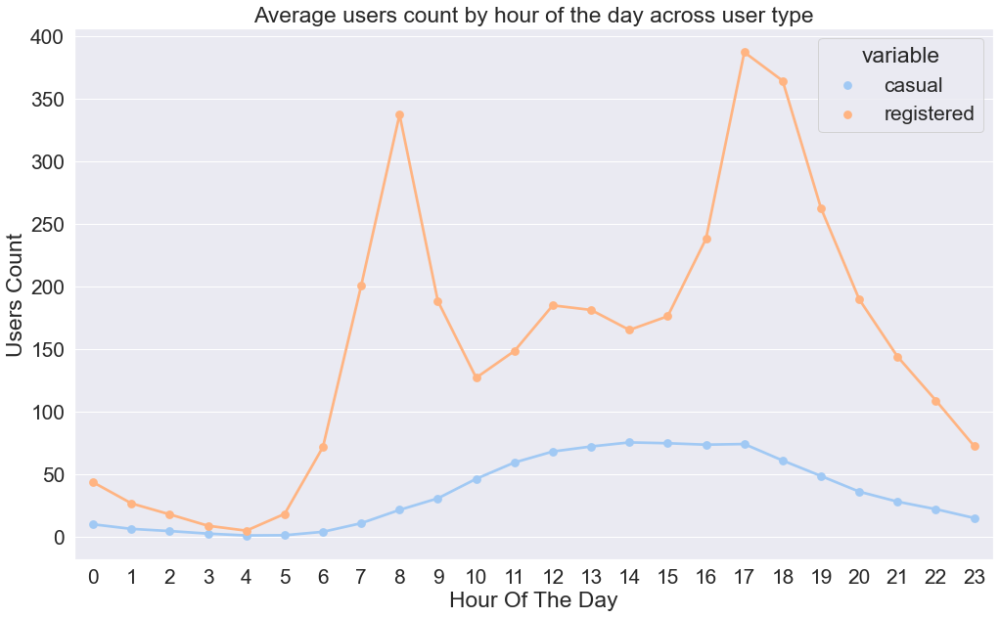

In [156]:
# graph setup
plt.figure(figsize=(15, 10),)
sns.set_palette('pastel')

#let's compare the average user count for registered and casual types along the hour of the day
hours_1 = pd.melt(hour_df[["hour","casual","registered"]], id_vars=['hour'], value_vars=['casual', 'registered']);
hours_2 = pd.DataFrame(hours_1.groupby(["hour","variable",],sort=True)["value"].mean()).reset_index();
ax = sns.pointplot(x=hours_2["hour"].astype(int), y=hours_2["value"],hue=hours_2["variable"],hue_order=["casual","registered",], data=hours_2);
ax.set(xlabel='Hour Of The Day', ylabel= 'Users Count', title="Average users count by hour of the day across user type", label='big');

<span style='background :yellow' > **Takeaways** </span>: ***The number of registered bike users spikes in the morning and the evening, which means that the users getting to work have got registered bikes. On the other hand, bike users at the weekend seem to rent bikes on a more casual basis, which goes hand in hand with previous assumptions. This also indicates that it could be a good idea to predict casual and registered separately, due to their different distributions.***

# 4 Machine Learning

* Machine Learning (predictive analytics) (3/3 points)
* Choosing sensible models (linear and non-linear)
* Tuning model parameters with validation (either with a fixed validation set or with cross-validation)
* Obtaining accurate predictions in test (measured with R2 score)
* Plotting predictions vs. reality for additional insights
* Bonus points for:
    * Plotting validation results to justify further choices (parameter ranges, other validations...)
    * Following an incremental approach (baseline models first, then more complex models, then combining models...)

## 4.1. Train-Test Splitting

In [158]:
#import libraries
from sklearn.model_selection import train_test_split

#split dataset into target column and features df
X = hour_df.drop(columns=["total_count", "casual", "registered","datetime"]).select_dtypes(include=np.number) 
y = hour_df.loc[:,hour_df.columns == "total_count"] #target column
y_casual = hour_df.loc[:,hour_df.columns == "casual"] #target column
y_registered = hour_df.loc[:,hour_df.columns == "registered"] #target column

#split data into train and test dataset using a test set of 25%)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state = 42)

## 4.2. Correlations

Plotting the correlation matrix on the following variables : ['windspeed', 'temp', 'humidity', 'apparent_temp', 'clear', 'heavy', 'light', 'mist', 'hour', 'year', 'month', 'day', 'season', 'holiday', 'weekday', 'workingday', 'weekend', 'daylight', 'peak_weekend', 'peak_workingday']


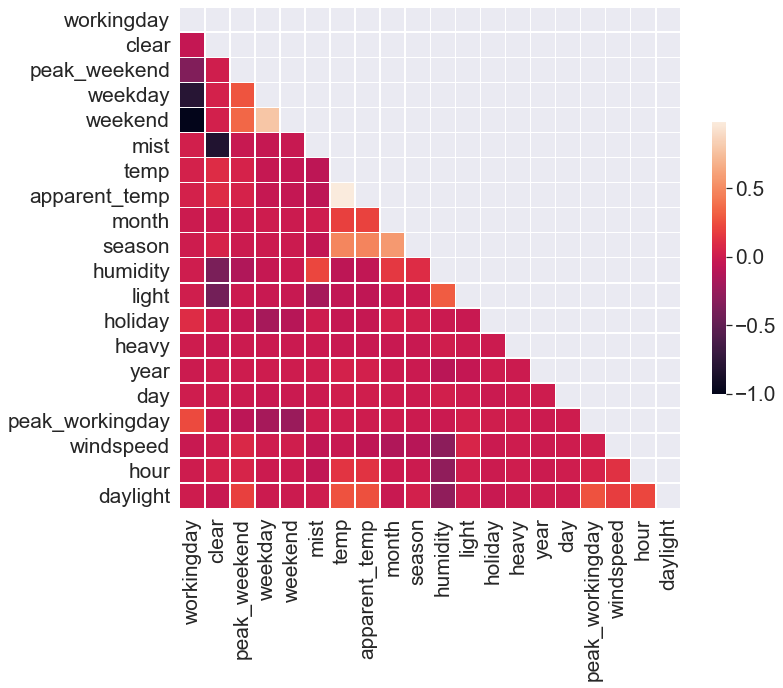

In [159]:
import scipy.cluster.hierarchy as sch   # Used for reordering the correlation matrix


# Get the column names
numerical_columns = list(X_train.select_dtypes(include=[np.number]).columns)
categorical_columns = list(X_train.select_dtypes(include=[object]).columns)
date_columns = list(X_train.select_dtypes(include=['<M8[ns]']).columns)

# Select variables to plot for the correlation matrix
corr_matrix_vars = numerical_columns[0:50]

print("Plotting the correlation matrix on the following variables : %s" % corr_matrix_vars)

# Only select the requested columns
df_corr_matrix = X_train[corr_matrix_vars]

# This computes the Pearson coefficient for all couples
corr = df_corr_matrix.corr().fillna(0)

# Generate features and distance matrix.
D = corr.values
# Compute and plot dendrogram.
Y = sch.linkage(D, 
                method='centroid',)
Z = sch.dendrogram(Y, 
                   orientation='right',
                   no_plot=True,)
# Compute distance matrix.
index = Z['leaves']
D = D[index,:]
D = D[:,index]

# Generate a mask for the upper triangle
mask = np.zeros_like(corr, 
                     dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
size = max(10, 
           len(corr.columns)/2.,);
f, ax = plt.subplots(figsize=(size, size));

# Draw the heatmap with the mask and correct aspect ratio

sns.heatmap(D, 
            mask=mask, 
            square=True, 
            linewidths=.5, 
            cbar_kws={"shrink": 0.5}, 
            ax=ax);

#ax.set(xticks=range(len(corr.columns)), xticklabels=corr.columns[index], yticks=range(len(corr.columns)), yticklabels=reversed(corr.columns[index]))
ax.set_xticklabels(corr.columns[index], 
                   rotation=90, 
                   ha='center',);
ax.set_yticklabels(corr.columns[index], 
                   rotation=0,);

<span style='background :yellow' > ***Takeaways*** </span>: ***The heatmap shows a strong correlation between obvious feature pairs like weekday-workingday, weekend-workingday, mist-clear, apparent-temp-temp. AS there are correlations it makes sense to test if PCA analysis will be suitable for feature reduction.***

## 4.3. PCA Analysis

In [160]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()

X_train_pca = sc.fit_transform(X_train)
## !! need to remeber to do this for test set as well

from sklearn.decomposition import PCA
pca = PCA(n_components=15)
X_train_pca = pca.fit_transform(X_train_pca)

explained_variance = pca.explained_variance_ratio_
explained_variance

array([0.15118767, 0.1349083 , 0.10742945, 0.08358277, 0.06213427,
       0.05302867, 0.05050217, 0.04984516, 0.0496087 , 0.04880091,
       0.04594437, 0.04237887, 0.03930826, 0.02828732, 0.02166428])

In [161]:
len(explained_variance)

15

In [162]:
explained_variance.sum()

0.9686111753124549

# 5. Prediction Algorithms

***To get an idea of how each model performs, the models will be run with there default parameters.***

In [163]:
#import libraries
from sklearn.pipeline import Pipeline
from sklearn import linear_model
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler
import xgboost
from sklearn import svm
from sklearn.svm import SVR
from sklearn.metrics import roc_curve, roc_auc_score, accuracy_score
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import uniform, randint

In [63]:
pipe = Pipeline([
        ('RF', print("AVG RF R2 of the 5 folds = {}".format(np.mean
                                                            (cross_val_score
                                                             (RandomForestRegressor
                                                              (random_state=42 , n_jobs= 6), 
                                                              X_train, y_train, cv=5, scoring= 'r2')
                                                            )
                                                           )
                    )
        ),
        ('LogReg', print("AVG Log R2 of the 5 folds = {}".format(np.mean
                                                                 (cross_val_score
                                                                  (linear_model.LogisticRegression
                                                                   (random_state = 42, max_iter=1000, solver='liblinear', n_jobs= 6), 
                                                                   X_train, y_train, cv=5, scoring= "r2")
                                                                 )
                                                                )
                        )
        ),
        ('XGBoost',  print("AVG XGboost R2 of the 5 folds = {}".format(np.mean
                                                                       (cross_val_score
                                                                        (xgboost.XGBRegressor
                                                                         (objective="reg:squarederror", random_state=42, n_jobs= 6),
                                                                         X_train, y_train, cv=5, scoring = 'r2')
                                                                       )
                                                                      )
                          )
        ),
        ('SVM linear', print("AVG SVM Accuracy of the 5 folds = {}".format(np.mean
                                                                       (cross_val_score
                                                                        (svm.SVR(C = 1,kernel='linear'), 
                                                                        X_train, y_train, cv=5, scoring = 'r2')
                                                                       )
                                                                      )
                            )
        ),
])

AVG RF R2 of the 5 folds = 0.9368126970895927
AVG Log R2 of the 5 folds = 0.44125265080261383
AVG XGboost R2 of the 5 folds = 0.9491565094671268
AVG Accuracy of the 5 folds = 0.6981364951481283


<span style='background :yellow' > ***Takeaways*** </span>:

* ***From the initial running of the models its clear that XGBoost and Random Forrest are our top option as solutions.***

* ***SVM will not be considered as its R2 score is very low with 0.69.***

* ***Regression achieved a very low score of 0.44. However there are methods such as elastic net and lasso regression which can improve the score significantly. These will be explored as solutions as well***

## 5.1.  Regression

An initial R2 score of Regression with default params is tested. 

In [95]:
print("AVG Log R2 of the 5 folds = {}".format(np.mean
                                              (cross_val_score
                                               (linear_model.LogisticRegression
                                                (random_state = 42, 
                                                 max_iter=1000, 
                                                 solver='liblinear', 
                                                 n_jobs = 6,),
                                                X_train, y_train, cv=5, scoring= "r2")
                                              )
                                             )
     )

AVG Log R2 of the 5 folds = 0.4404227230813761


***It achieved a very bad R2 score of 0.44. We will attempt to improve this with the use of Eleastic net, and Lasso regression***

## 5.2. Elastic Net 

In [96]:
#try with Elastic Net
from sklearn.linear_model import ElasticNet

enet = ElasticNet(alpha=0.01, l1_ratio=0.6)

y_pred_enet = enet.fit(X_train, y_train).predict(X_test)
r2_score_enet = r2_score(y_test, y_pred_enet)
print(enet)
print("r^2 on test data : %f" % r2_score_enet)

ElasticNet(alpha=0.01, l1_ratio=0.6)
r^2 on test data : 0.718810


<span style='background :yellow' > ***Takeaways*** </span>: ***We can see an improvement from 44% to 71% with Elastic net***

## 5.3. Lasso 

In [97]:
# try with Lasso
from sklearn.linear_model import Lasso

lasso = Lasso(alpha=0.01)

y_pred_lasso = lasso.fit(X_train, y_train).predict(X_test)
r2_score_lasso = r2_score(y_test, y_pred_lasso)
print(lasso)
print("r^2 on test data : %f" % r2_score_lasso)

Lasso(alpha=0.01)
r^2 on test data : 0.719551


#### Compare Elastic Net and Lasso R2 

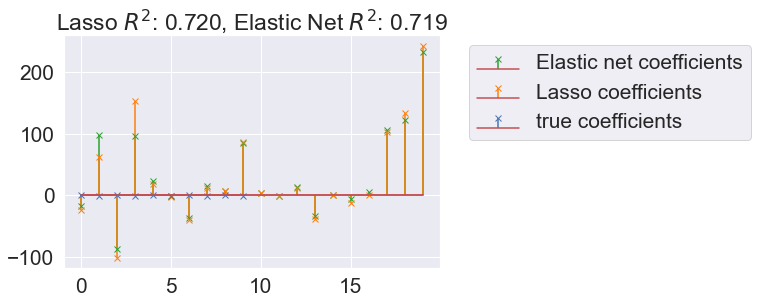

In [98]:
#Plotting to compare Lasso and Elasticnet R2

# Decreasing coef w. alternated signs for visualization
n_features = len(X_train.columns)
idx = np.arange(n_features)
coef = (-1) ** idx * np.exp(-idx / 10)
coef[10:] = 0  # sparsify coef
y = np.dot(X, coef)

#Plotting      
m, s, _ = plt.stem(np.where(enet.coef_)[0], enet.coef_[enet.coef_!=0],
                   markerfmt='x', label='Elastic net coefficients',
                   use_line_collection=True)
plt.setp([m, s], color="#2ca02c")

m, s, _ = plt.stem(np.where(lasso.coef_)[0], lasso.coef_[lasso.coef_!=0],
                   markerfmt='x', label='Lasso coefficients',
                   use_line_collection=True)
plt.setp([m, s], color='#ff7f0e')

plt.stem(np.where(coef)[0], coef[coef!=0], label='true coefficients',
         markerfmt='bx', use_line_collection=True)

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

plt.title("Lasso $R^2$: %.3f, Elastic Net $R^2$: %.3f"
          % (r2_score_lasso, r2_score_enet))
plt.show()

<span style='background :yellow' > ***Takeaways*** </span>: ***Both Elastic Net and Lasso improve the Logistic Regression performance with the same impact, ending with a similar R2 score of 0.72. This is most likely because as it can be seen in the graph that their coefficiants are placed around similar regions.***

***A R2 score of 0.72 is much worse than the other algorithms. Therefore Elastic Net and Lasso regression is not considered a valid solution to use.***

## 5.4.  Random Forrest 

In [56]:
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestRegressor
from scipy.stats import uniform, randint
from sklearn.model_selection import RandomizedSearchCV
RandomForestRegressor()

RandomForestRegressor()

***Lets first get an initial benchmark of the performance of a Random Forrest Classfifeir witht this data set:***

***(Performance will be checked using cross validation with 5 folds)***

In [51]:
print("AVG R2 of the 5 folds = {}".format(np.mean
                                          (cross_val_score
                                           (RandomForestRegressor
                                            (random_state=42), 
                                            X_train, y_train, cv=5)
                                          )
                                         )
     )

AVG R2 of the 5 folds = 0.9368126970895927


##### Feature importance with RandomForestRegressor

In [29]:
#import libraries
from sklearn.ensemble import RandomForestRegressor
from sklearn.inspection import permutation_importance

#set and fit the Regressor
rf = RandomForestRegressor(n_estimators=100)
rf.fit(X_train, y_train)

RandomForestRegressor()

In [30]:
#sort the values based on their importance
rf_important = pd.Series(rf.feature_importances_, 
                         index=X_train.columns,)
rf_important.sort_values(ascending=False)

daylight           0.321467
hour               0.169797
peak_workingday    0.118575
year               0.096811
temp               0.082677
apparent_temp      0.040467
peak_weekend       0.031912
humidity           0.026466
month              0.022759
weekday            0.017904
light              0.013931
day                0.013583
holiday            0.009970
windspeed          0.009269
season             0.008385
workingday         0.006882
weekend            0.005413
clear              0.002493
mist               0.001235
heavy              0.000002
dtype: float64

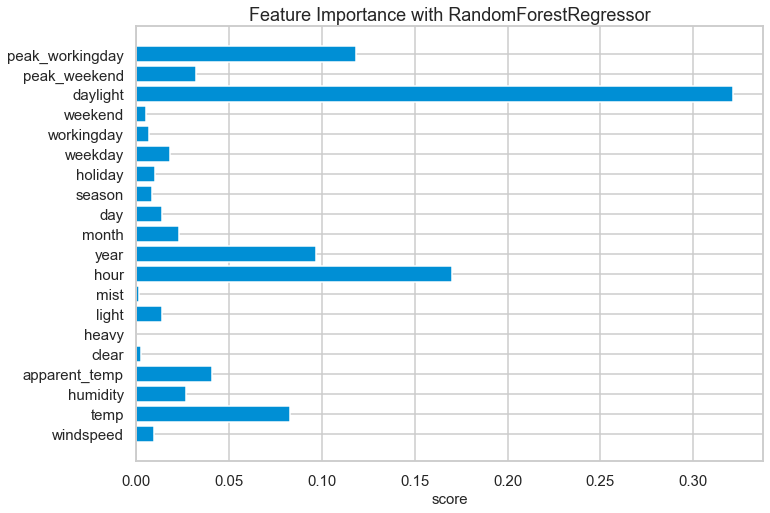

In [31]:
#plot for a better view
plt.figure(figsize=(10,8));
plt.barh(X_train.columns, rf_important);
plt.title("Feature Importance with RandomForestRegressor")
plt.xlabel("score",fontsize = 15);
plt.xticks(fontsize=15);
plt.yticks(fontsize=15);

<span style='background :yellow' > ***Takeaways*** </span>:
***It can be seen from the feature importance that the top 4 most important features for random forest are:***

* ***daylight***
* ***hour*** 
* ***peak_workingday***
* ***year***

***All of the features are being used except heavy. Showing that the algorithm is not putting to much importance on one feature and overfitting to that feature.***


***Due to the nature of Random Forest selecting features automatically, no more feature handling needs to be done for Random Forest***

### 5.4.1 PCA vs. No PCA

***To evaluate whether PCA will improve our predictions. The random forest is run with PCA and without PCA. Each time the hyperparameters are optimized however with a small amount of iterations (20), as we just want to compare the results. A final optimization will be done after.***

##### Random Forrest without PCA

In [34]:
from sklearn.model_selection import RandomizedSearchCV

RF_pipe = Pipeline(steps = [ ('RF', RandomForestRegressor(random_state=42)) ])

params = {
    'RF__bootstrap':         [True, False],
    'RF__max_depth':         randint(5,30),
    'RF__max_features':      ['sqrt', 'log2'],
    'RF__min_samples_leaf':  [1, 2, 5, 10],
    'RF__min_samples_split': [2, 3, 5, 10],
    'RF__n_estimators':      [ 100,200,500, 750, 1000, 1500],
   
}
# Create a grid search to try all the possible number of PCs
estimator = RandomizedSearchCV(RF_pipe, 
                               params, 
                               cv=5, 
                               n_iter=20, 
                               n_jobs=-1, 
                               scoring = 'r2' ) 

estimator.fit(X_train, y_train)
print("Randomized Search Finished")

Randomized Search Finished


In [35]:
estimator.best_estimator_

Pipeline(steps=[('RF',
                 RandomForestRegressor(bootstrap=False, max_depth=20,
                                       max_features='sqrt', min_samples_leaf=2,
                                       min_samples_split=3, n_estimators=1000,
                                       random_state=42))])

In [39]:
print("R2 of the model with the optimal hyperparameter configuration = {0:.4f}".format(estimator.best_score_))

R2 of the model with the optimal hyperparameter configuration = 0.9296


#### Random Forest With PCA 

In [45]:
from sklearn.model_selection import RandomizedSearchCV

RF_pipe = Pipeline(steps = [ ('pca', PCA() ), ('RF', RandomForestRegressor(random_state=42)) ])

n_components = list(range(15,16))
params = {
    'pca__n_components':     n_components,
    'RF__bootstrap':         [True, False],
    'RF__max_depth':         randint(5,30),
    'RF__max_features':      ['sqrt', 'log2'],
    'RF__min_samples_leaf':  [1, 2, 5, 10],
    'RF__min_samples_split': [2, 3, 5, 10],
    'RF__n_estimators':      [ 100,200,500, 750, 1000, 1500],
   
}
# Create a grid search to try all the possible number of PCs
estimator = RandomizedSearchCV(RF_pipe, 
                               params, 
                               cv=5, 
                               n_iter=20, 
                               n_jobs=-1, 
                               scoring = 'r2' ) 

estimator.fit(X_train, y_train)
print("Randomized Search Finished")

Randomized Search Finished


In [46]:
estimator.best_estimator_

Pipeline(steps=[('pca', PCA(n_components=15)),
                ('RF',
                 RandomForestRegressor(bootstrap=False, max_depth=23,
                                       max_features='log2', min_samples_split=3,
                                       n_estimators=200, random_state=42))])

In [47]:
print("R2 of the model with the optimal hyperparameter configuration = {0:.4f}".format(estimator.best_score_))

R2 of the model with the optimal hyperparameter configuration = 0.9297


***It is seen that Random Forest with PCA achieved the same accuracy as without. As there is no clear improvment it indicates PCA is not really beneficial to apply here. Therefore, random forest without PCA will be used as it is a simpler modeling procedure.*** 

### 5.4.2. Final optimization of RandomForest model

***To attempt to improve the R2 score more, a further optermization of the hyperparameters at a more granular level around the regions identified as optimal previously will be done.***

In [59]:
from sklearn.model_selection import RandomizedSearchCV


RF_pipe = Pipeline(steps = [ ('RF', RandomForestRegressor(random_state=42)) ])

params = {
    'RF__bootstrap':         [True, False],
    'RF__max_depth':         randint(16,24),
    'RF__max_features':      ['sqrt', 'log2'],
    'RF__min_samples_leaf':  [2],
    'RF__min_samples_split': [3],
    'RF__n_estimators':      [ 500, 900, 1000,1200 ],
   
}
# Create a grid search to try all the possible number of PCs
estimator = RandomizedSearchCV(RF_pipe, 
                               params, 
                               cv=5, 
                               n_iter=100, 
                               n_jobs=-1, 
                               scoring = 'r2' ) 

estimator.fit(X_train, y_train)
print("Randomized Search Finished")

Randomized Search Finished


In [60]:
estimator.best_estimator_

Pipeline(steps=[('RF',
                 RandomForestRegressor(bootstrap=False, max_depth=22,
                                       max_features='sqrt', min_samples_leaf=2,
                                       min_samples_split=3, n_estimators=1200,
                                       random_state=42))])

In [61]:
print("R2 of the model with the optimal hyperparameter configuration = {0:.4f}".format(estimator.best_score_))

R2 of the model with the optimal hyperparameter configuration = 0.9298


***Predicting over the Test set***

In [62]:
RFmodel = RandomForestRegressor(bootstrap=False, 
                                max_depth=22,
                                max_features='sqrt', min_samples_leaf=2,
                                min_samples_split=3, n_estimators=1200,
                                random_state=42)
RFmodel.fit(X_train,y_train)

RandomForestRegressor(bootstrap=False, max_depth=22, max_features='sqrt',
                      min_samples_leaf=2, min_samples_split=3,
                      n_estimators=1200, random_state=42)

In [63]:
rf_predictions = RFmodel.predict(X_test)

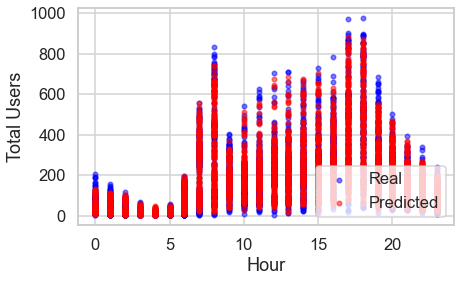

In [64]:
# Import library for visualization
import matplotlib.pyplot as plt

# Define x axis
x_axis = X_test.hour

# Build scatterplot
plt.scatter(x_axis, 
            y_test, 
            c = 'b', 
            alpha = 0.5, 
            marker = '.', 
            label = 'Real')

plt.scatter(x_axis, 
            rf_predictions, 
            c = 'r', 
            alpha = 0.5, 
            marker = '.', 
            label = 'Predicted')

plt.xlabel('Hour')
plt.ylabel('Total Users')
plt.grid(color = '#D3D3D3', 
         linestyle = 'solid')
plt.legend(loc = 'lower right')
plt.show()

In [69]:
from sklearn.metrics import  accuracy_score

# Mean absolute error (MAE)
mae = mean_absolute_error(y_test.values.ravel(), rf_predictions)

# Mean squared error (MSE)
mse = mean_squared_error(y_test.values.ravel(), rf_predictions)

# R-squared scores
r2 = r2_score(y_test.values.ravel(), rf_predictions)

# Print metrics
print('Mean Absolute Error:', round(mae, 2))
print('Mean Squared Error:', round(mse, 2))
print('R-squared scores:', round(r2, 2))

Mean Absolute Error: 30.17
Mean Squared Error: 2100.77
R-squared scores: 0.93


## 5.5. XGBoost

***We will get a anitial benchmark of XGBoost using default parameters***

In [50]:
import xgboost

In [76]:
 print("AVG XGboost R2 of the 5 folds = {}".format(np.mean(cross_val_score
                                                           (xgboost.XGBRegressor
                                                            (objective="reg:squarederror", random_state=42, n_jobs= 6)
                                                            , X_train, y_train, cv=5, scoring = 'r2')
                                                          )
                                                  )
      )

AVG XGboost R2 of the 5 folds = 0.9487023983703937


***This is already better than the random forest. Indicting XGBoost is a good model to use for this use case.***

### 5.5.1. Optimized Hyperparameters:

***As we have seen that it does not make sense to apply PCA. We will not test it with XGBoost.***

***The optimal hyperparaneters will be found using Randomized grid search.***

In [98]:
from sklearn.model_selection import RandomizedSearchCV

XG_pipe = Pipeline(steps = [ ('XGBoost', xgboost.XGBRegressor(objective="reg:squarederror", random_state=42,)) ])

params = {
    "XGBoost__colsample_bytree": uniform(0.7, 0.3),
    "XGBoost__gamma": uniform(0, 0.5),
    "XGBoost__learning_rate": uniform(0.03, 0.3), # default 0.1 
    "XGBoost__max_depth": randint(2, 20), # default 3
    "XGBoost__n_estimators": randint(100, 500), # default 100
    "XGBoost__subsample": uniform(0.1, 0.8),
}
# Create a grid search to try all the possible number of PCs
XG_estimator = RandomizedSearchCV(XG_pipe, 
                               params, 
                               cv=5, 
                               n_iter=200, 
                               n_jobs=-1, 
                               scoring = 'r2' ) 

XG_estimator.fit(X_train, y_train)
print("Randomized Search Finished")

Randomized Search Finished


In [99]:
XG_estimator.best_estimator_

Pipeline(steps=[('XGBoost',
                 XGBRegressor(base_score=0.5, booster='gbtree',
                              colsample_bylevel=1, colsample_bynode=1,
                              colsample_bytree=0.8082001513489283,
                              gamma=0.052882366382714874, gpu_id=-1,
                              importance_type='gain',
                              interaction_constraints='',
                              learning_rate=0.04648040346503496,
                              max_delta_step=0, max_depth=9, min_child_weight=1,
                              missing=nan, monotone_constraints='()',
                              n_estimators=434, n_jobs=0, num_parallel_tree=1,
                              random_state=42, reg_alpha=0, reg_lambda=1,
                              scale_pos_weight=1, subsample=0.5398508963040348,
                              tree_method='exact', validate_parameters=1,
                              verbosity=None))])

In [100]:
print("R2 of the model with the optimal hyperparameter configuration = {0:.4f}".format(XG_estimator.best_score_))

R2 of the model with the optimal hyperparameter configuration = 0.9577


### 5.4.2. Optimal XGBoost Model

In [101]:
XGboost = xgboost.XGBRegressor(objective= 'reg:squarederror' , 
                               colsample_bytree = 0.8082001513489283, 
                               gamma = 0.052882366382714874, 
                               learning_rate = 0.04648040346503496, 
                               max_depth = 9, 
                               n_estimators = 434, 
                               subsample = 0.5398508963040348, 
                               random_state=42, 
                               n_jobs= 6,) # add optimal hyperparameter values 
XGboost.fit(X_train,y_train)

XG_predictions = XGboost.predict(X_test)

In [102]:
XG_predictions.shape

(4345,)

In [103]:
y_test.shape

(4345, 1)

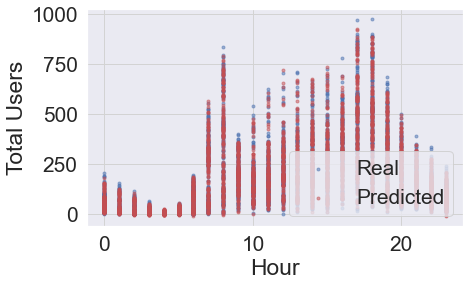

In [104]:
# Import library for visualization
import matplotlib.pyplot as plt

# Define x axis
x_axis = X_test.hour

# Build scatterplot
plt.scatter(x_axis, 
            y_test, 
            c = 'b', 
            alpha = 0.5, 
            marker = '.', 
            label = 'Real')

plt.scatter(x_axis, 
            XG_predictions, 
            c = 'r', 
            alpha = 0.5, 
            marker = '.', 
            label = 'Predicted')

plt.xlabel('Hour')
plt.ylabel('Total Users')
plt.grid(color = '#D3D3D3', 
         linestyle = 'solid')
plt.legend(loc = 'lower right')
plt.show()

In [108]:
from sklearn.metrics import  accuracy_score

# Mean absolute error (MAE)
mae = mean_absolute_error(y_test.values.ravel(), XG_predictions)

# Mean squared error (MSE)
mse = mean_squared_error(y_test.values.ravel(), XG_predictions)

# R-squared scores
r2 = r2_score(y_test.values.ravel(), XG_predictions)

# Print metrics
print('Mean Absolute Error:', round(mae, 2))
print('Mean Squared Error:', round(mse, 2))
print('R-squared scores:', round(r2, 2))

Mean Absolute Error: 21.59
Mean Squared Error: 1270.46
R-squared scores: 0.96


### 5.5.3. XGBoost Feature Evaluation

***We will investigate the features used in the XGBoost model. The features will be evaluated by their importance. Then a model with using only those features with high importance will be run to see if it can improve our R2 score.***

#### Recursive Feature Elimination:

***Recursive feature elimination (RFE) is a feature selection method that fits a model and removes the weakest feature (or features) until the specified number of features is reached.***

In [110]:
#import libraries
from sklearn.feature_selection import RFE           
import xgboost

# feature extraction with XGBRegressor
model_rfe = xgboost.XGBRegressor()       
rfe1 = RFE(model_rfe, 10)                              
fit_rfe = rfe1.fit(X_train, y_train)
print("Num Features: %d" % fit_rfe.n_features_)
print("Selected Features: %s" % fit_rfe.support_)
print("Feature Ranking: %s" % fit_rfe.ranking_)

Num Features: 10
Selected Features: [False  True False  True False False  True False  True  True False False
  True  True False False False  True  True  True]
Feature Ranking: [ 7  1  4  1  5  9  1  8  1  1  3  6  1  1  2 10 11  1  1  1]


In [111]:
#apply the selected features given as numpy array to the dataset (X) to extract the most important features by name
selected_cols = fit_rfe.support_
X.iloc[:, selected_cols].columns

Index(['temp', 'apparent_temp', 'light', 'hour', 'year', 'season', 'holiday',
       'daylight', 'peak_weekend', 'peak_workingday'],
      dtype='object')

<span style='background :yellow' > ***Takeaways*** </span>: The most important features based on RFE are temp, apparent_temp, light, year, season, holiday, daylight, peak_weend and peak_workingday

#### Forward Feature Selection (Sequential Feature Selector):

***Forward selection is an iterative method in which we start with having no feature in the model. In each iteration, we keep adding the feature which best improves our model till an addition of a new variable does not improve the performance of the model.***

In [112]:
#import libraries
from sklearn.metrics import r2_score as r2
from mlxtend.feature_selection import SequentialFeatureSelector as sfs

# Build step forward feature selection with rfe1 = XGBoostRegressor defined in recursive feature selection above
sfs1 = sfs(rfe1,
           k_features=7,   #select 7 features
           forward=True,
           floating=False,
           scoring='r2',   #use r²-score
           cv=5)

In [113]:
sfs1.fit(X_train,y_train)

SequentialFeatureSelector(estimator=RFE(estimator=XGBRegressor(base_score=None,
                                                               booster=None,
                                                               colsample_bylevel=None,
                                                               colsample_bynode=None,
                                                               colsample_bytree=None,
                                                               gamma=None,
                                                               gpu_id=None,
                                                               importance_type='gain',
                                                               interaction_constraints=None,
                                                               learning_rate=None,
                                                               max_delta_step=None,
                                                               max_depth=None,
       

In [114]:
#get a df witht he most important features under FFS
feat_cols = list(sfs1.k_feature_idx_)
X.iloc[:,feat_cols]

,windspeed,apparent_temp,hour,year,month,day,weekday
0,0.0000,0.2879,0.0,2011.0,1.0,1.0,5.0
1,0.0000,0.2727,1.0,2011.0,1.0,1.0,5.0
2,0.0000,0.2727,2.0,2011.0,1.0,1.0,5.0
3,0.0000,0.2879,3.0,2011.0,1.0,1.0,5.0
4,0.0000,0.2879,4.0,2011.0,1.0,1.0,5.0
...,...,...,...,...,...,...,...
17374,0.1642,0.2576,19.0,2012.0,12.0,31.0,0.0
17375,0.1642,0.2576,20.0,2012.0,12.0,31.0,0.0
17376,0.1642,0.2576,21.0,2012.0,12.0,31.0,0.0
17377,0.1343,0.2727,22.0,2012.0,12.0,31.0,0.0


<span style='background :yellow' > ***Takeaways*** </span>: ***Using the Sequential Feature Selector with the XGBoostRegressor used in the Recursive Feature Elimination method before, the 7 most important features are windspeed, apparent_temp, hour, year, month, day and weekday and differ from the RFE method.***

### 5.5.4. Feature Selection for XGBoost

In [121]:
xgb_train = X_train[['temp', 'apparent_temp', 'light', 'hour', 'year', 'season', 'holiday','daylight', 'peak_weekend', 'peak_workingday', 'windspeed', 'month', 'weekday', 'day']]
xgb_test = X_test[['temp', 'apparent_temp', 'light', 'hour', 'year', 'season', 'holiday','daylight', 'peak_weekend', 'peak_workingday', 'windspeed', 'month', 'weekday', 'day']]

In [122]:
XGboost = xgboost.XGBRegressor(objective= 'reg:squarederror' , 
                               colsample_bytree = 0.8082001513489283, 
                               gamma = 0.052882366382714874, 
                               learning_rate = 0.04648040346503496, 
                               max_depth = 9, 
                               n_estimators = 434, 
                               subsample = 0.5398508963040348, 
                               random_state=42, 
                               n_jobs= 6,) # add optimal hyperparameter values 
XGboost.fit(xgb_train,y_train)

XG_predictions_2 = XGboost.predict(xgb_test)

In [123]:
from sklearn.metrics import  accuracy_score

# Mean absolute error (MAE)
mae = mean_absolute_error(y_test.values.ravel(), XG_predictions_2)

# Mean squared error (MSE)
mse = mean_squared_error(y_test.values.ravel(), XG_predictions_2)

# R-squared scores
r2 = r2_score(y_test.values.ravel(), XG_predictions_2)

# Print metrics
print('Mean Absolute Error:', round(mae, 2))
print('Mean Squared Error:', round(mse, 2))
print('R-squared scores:', round(r2, 2))

Mean Absolute Error: 22.53
Mean Squared Error: 1430.95
R-squared scores: 0.96


<span style='background :yellow' > ***Takeaways*** </span>: ***Using only this reduced selection of features the R_sqaured stayed the same, however, the other Metrics performed slightly worse, which is why we stick to the original feature selection.***

## 6. Predicting casual & registered separately

***It will be interesting to see if the model performs better predicting the number of casual and registered users seperatly and then adding them to get the total users.***

***The Optimal XGBoost model found previously will be used to make the predictions.***

In [34]:
#split data into train and test dataset using a test set of 25%)
X_train_c, X_test_c, y_train_c, y_test_c = train_test_split(X, y_casual, test_size=0.25, random_state = 42)
X_train_r, X_test_r, y_train_r, y_test_r = train_test_split(X, y_registered, test_size=0.25, random_state = 42)

model_casual = xgboost.XGBRegressor(objective= 'reg:squarederror' , 
                               colsample_bytree = 0.8082001513489283, 
                               gamma = 0.052882366382714874, 
                               learning_rate = 0.04648040346503496, 
                               max_depth = 9, 
                               n_estimators = 434, 
                               subsample = 0.5398508963040348, 
                               random_state=42, 
                               n_jobs= 6,)

model_registered = xgboost.XGBRegressor(objective= 'reg:squarederror' , 
                               colsample_bytree = 0.8082001513489283, 
                               gamma = 0.052882366382714874, 
                               learning_rate = 0.04648040346503496, 
                               max_depth = 9, 
                               n_estimators = 434, 
                               subsample = 0.5398508963040348, 
                               random_state=42, 
                               n_jobs= 6,)
model_casual.fit(X_train_c,y_train_c)
model_registered.fit(X_train_r,y_train_r)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=0.8082001513489283,
             gamma=0.052882366382714874, gpu_id=-1, importance_type='gain',
             interaction_constraints='', learning_rate=0.04648040346503496,
             max_delta_step=0, max_depth=9, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=434, n_jobs=6,
             num_parallel_tree=1, random_state=42, reg_alpha=0, reg_lambda=1,
             scale_pos_weight=1, subsample=0.5398508963040348,
             tree_method='exact', validate_parameters=1, verbosity=None)

In [35]:
model_casual_predictions = model_casual.predict(X_test_c)
model_registered_predictions = model_registered.predict(X_test_r)

sum_predictions = np.add(model_casual_predictions, model_registered_predictions)

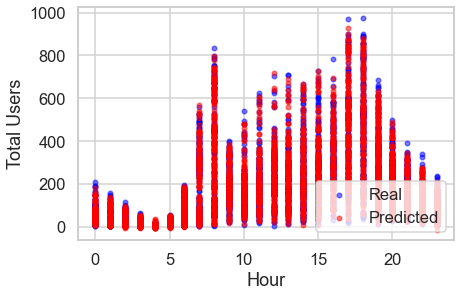

In [39]:
# Import library for visualization
import matplotlib.pyplot as plt

# Define x axis
x_axis = X_test.hour

# Build scatterplot
plt.scatter(x_axis, 
            y_test, 
            c = 'b', 
            alpha = 0.5, 
            marker = '.', 
            label = 'Real')

plt.scatter(x_axis, 
            sum_predictions, 
            c = 'r', 
            alpha = 0.5, 
            marker = '.', 
            label = 'Predicted')

plt.xlabel('Hour')
plt.ylabel('Total Users')
plt.grid(color = '#D3D3D3', 
         linestyle = 'solid')
plt.legend(loc = 'lower right')
plt.show()

In [42]:
# Mean absolute error (MAE)
mae = mean_absolute_error(y_test.values.ravel(), sum_predictions)

# Mean squared error (MSE)
mse = mean_squared_error(y_test.values.ravel(), sum_predictions)

# R-squared scores
r2 = r2_score(y_test.values.ravel(), sum_predictions)

# Print metrics
print('Mean Absolute Error:', round(mae, 2))
print('Mean Squared Error:', round(mse, 2))
print('R-squared scores:', round(r2, 2))

Mean Absolute Error: 21.37
Mean Squared Error: 1223.83
R-squared scores: 0.96


<span style='background :yellow' > ***Takeaways*** </span>: ***Although it achieved the same R2 score (0.96), the MAE and MSE are marginally better when you predict casual and registered separately. Therefore, we would recommend this model as a final solution!***